This notebook loads the pickled dictionary with the presidents' raw and aggregated popularity, concatenates the raw popularity of each one, and saves all these data in a unique CSV file for sharing

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc3 as pm
import xarray as xr

from scipy.special import expit as logistic

In [2]:
%config InlineBackend.figure_format = 'retina'
RANDOM_SEED = 8927
np.random.seed(RANDOM_SEED)
az.style.use('arviz-darkgrid')

In [3]:
PARTIES = {
    "chirac2": "right",
    "sarkozy": "right",
    "hollande": "left",
    "macron": "center",
}

def standardize(series):
    """Standardize a pandas series"""
    return (series - series.mean()) / series.std()

In [4]:
all_presidents = pd.read_excel(
    "../data/raw_popularity_presidents.xlsx", index_col=0, parse_dates=True
)
all_presidents

,president,sondage,samplesize,method,approve_pr,disapprove_pr
1978-09-28,vge,Kantar,1040,face to face,60.0,33.0
1978-10-17,vge,Ifop,949,phone,52.0,35.0
1978-10-28,vge,Kantar,964,face to face,59.0,34.0
1978-11-19,vge,Ifop,1069,phone,53.0,37.0
1978-11-24,vge,Kantar,928,face to face,62.0,33.0
...,...,...,...,...,...,...
2020-07-10,macron,Ifop,1018,internet,38.0,62.0
2020-07-16,macron,BVA,1000,internet,39.0,61.0
2020-07-16,macron,Ifop,974,internet,37.0,63.0
2020-07-22,macron,Harris,960,internet,50.0,50.0


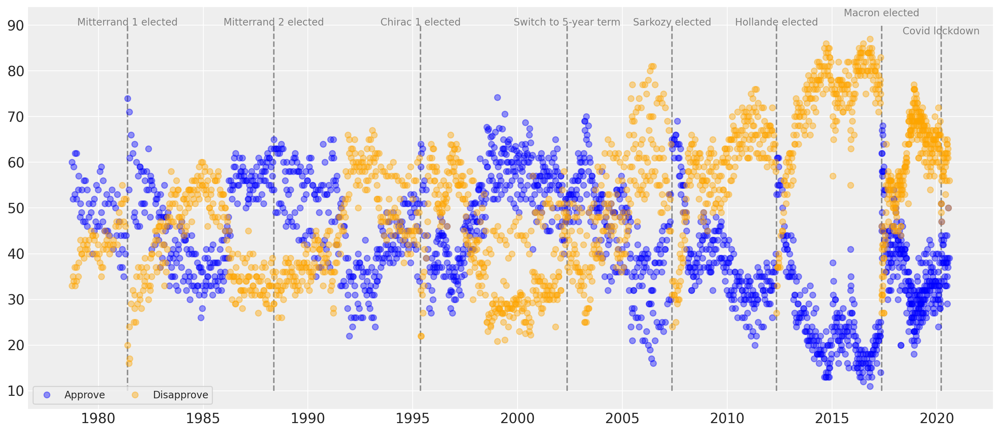

In [6]:
_, ax = plt.subplots(1, 1, figsize=(14, 6))

ax.plot(
    all_presidents.index, all_presidents.approve_pr, "ob", label="Approve", alpha=0.4
)
ax.plot(
    all_presidents.index,
    all_presidents.disapprove_pr,
    "o",
    color="orange",
    label="Disapprove",
    alpha=0.4,
)

ax.vlines(pd.to_datetime("1981-05-25"), 10, 90, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("1981-05-25"),
    90,
    "Mitterrand 1 elected",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("1988-05-16"), 10, 90, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("1988-05-16"),
    90,
    "Mitterrand 2 elected",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("1995-05-18"), 10, 90, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("1995-05-18"),
    90,
    "Chirac 1 elected",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2002-05-14"), 10, 90, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2002-05-14"),
    90,
    "Switch to 5-year term",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2007-05-16"), 10, 90, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2007-05-16"),
    90,
    "Sarkozy elected",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2012-05-11"), 10, 90, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2012-05-11"),
    90,
    "Hollande elected",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2017-05-17"), 10, 90, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2017-05-17"),
    92,
    "Macron elected",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2020-03-17"), 10, 90, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2020-03-17"),
    88,
    "Covid lockdown",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

plt.legend(fontsize=10, ncol=2, loc="lower left", frameon=True);

In [5]:
# restrict data to after the switch to 5-year term
d = all_presidents.loc[all_presidents.index >= pd.to_datetime("2002-05-05")]
# d = all_presidents[(all_presidents.president == "macron") | (all_presidents.president == "hollande")]

# convert to proportions
d[["approve_pr", "disapprove_pr"]] = d[["approve_pr", "disapprove_pr"]].copy() / 100
d = d.rename(columns={"approve_pr": "p_approve", "disapprove_pr": "p_disapprove"})

# raw monthly average to get fixed time intervals
d = d.groupby("president").resample("M").mean().reset_index(level=0).sort_index()

d["party"] = d.president.replace(PARTIES)

/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/pandas/core/frame.py:2963: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[k1] = value[k2]


In [6]:
ELECTION_FLAGS = (
    (d.index.year == 2002) & (d.index.month == 5)
    | (d.index.year == 2007) & (d.index.month == 5)
    | (d.index.year == 2012) & (d.index.month == 5)
    | (d.index.year == 2017) & (d.index.month == 5)
)
d["election_flag"] = 0
d.loc[ELECTION_FLAGS, "election_flag"] = 1

# convert to nbr of successes
d["N_approve"] = d.samplesize * d["p_approve"]
d["N_disapprove"] = d.samplesize * d["p_disapprove"]
d[["N_approve", "N_disapprove"]] = d[["N_approve", "N_disapprove"]].round().astype(int)

# compute total trials
d["N_total"] = d.N_approve + d.N_disapprove
d

,president,samplesize,p_approve,p_disapprove,party,election_flag,N_approve,N_disapprove,N_total
2002-05-31,chirac2,964.250000,0.502500,0.442500,right,1,485,427,912
2002-06-30,chirac2,970.000000,0.505000,0.425000,right,0,490,412,902
2002-07-31,chirac2,947.333333,0.533333,0.406667,right,0,505,385,890
2002-08-31,chirac2,1028.000000,0.520000,0.416667,right,0,535,428,963
2002-09-30,chirac2,1017.500000,0.525000,0.420000,right,0,534,427,961
...,...,...,...,...,...,...,...,...,...
2020-04-30,macron,1174.400000,0.406000,0.582000,center,0,477,684,1161
2020-05-31,macron,1126.428571,0.371429,0.594286,center,0,418,669,1087
2020-06-30,macron,1124.714286,0.362857,0.612857,center,0,408,689,1097
2020-07-31,macron,991.200000,0.398000,0.602000,center,0,394,597,991


In [7]:
def dates_to_idx(timelist):
    """Convert datetimes to numbers in reference to a given date. Useful for posterior predictions."""

    reference_time = timelist[0]
    t = (timelist - reference_time) / np.timedelta64(1, "M")

    return np.asarray(t)

In [8]:
time = dates_to_idx(d.index)
time[:10]

array([0.        , 0.98564652, 2.00414793, 3.02264934, 4.00829586,
       5.02679726, 6.01244379, 7.03094519, 8.0494466 , 8.96938335])

Priors are very important to fit GPs properly, so let's spend some time thinking about our priors for a more refined model of the popularity of the president. We start by the priors for the lengthscale and period parameters:
- `ls_trend`: The lengthscale of the long term trend. It has a wide prior with most of the mass between 1 to 3 years.
- `ls_med`: This is the lengthscale for the short to medium long variations. This prior has most of its mass below 2 years.
- `scale_mixture_rate` of the Rational Quadratic kernel: It is equivalent to using a combination of Exponential Quadratic kernels with different length scales. As the scale mixture rate approaches infinity, the kernel becomes exactly equivalent to the Exponential Quadratic Kernel. We center the prior for this parameter around 3, since we’re expecting that there is some more variation than could be explained by an exponentiated quadratic kernel.
- `period` of the semi-periodic component: We don't have a strong prior on this, so we'll center the period at one year, with the possibility for short-term seasonality as well as longer seasonality.
- `ls_period`: The smoothness of the semi-periodic component. It controls how “sinusoidal” the periodicity is. The plot of the data shows that seasonality is quite far from a sine wave, so we use a Gamma whose mode is at 2, and a relatively large variance.
- `ls_period_decay`: The periodic decay. The smaller this parameter, the faster the periodicity goes away. I suspect the seasonality of popularity goes away quite quickly, so let's put most of the prior mass between 6 months and 2 years.

If you're a bit lost, that's quite normal: parameters for GPs are not easily interpretable so it takes some time to develop intuition about them -- all the more so because the Gamma distribution is very flexible, so it can take _a lot_ of different shapes. Here are good educational ressources to think about priors in the context of GPs:
- PyMC3's CO2 at Mauna Loa [example notebook](https://docs.pymc.io/notebooks/GP-MaunaLoa.html).
- PyMC3's notebook for [mean and covariance functions](https://docs.pymc.io/notebooks/GP-MeansAndCovs.html).
- PyMC4's notebook for [mean and covariance functions](https://github.com/pymc-devs/pymc4/blob/master/notebooks/GP-Kernels.ipynb).
- Michael Betancourt's ["Probabilistic Building Blocks"](https://betanalpha.github.io/assets/case_studies/probability_densities.html#25_the_gamma_family) case-study.

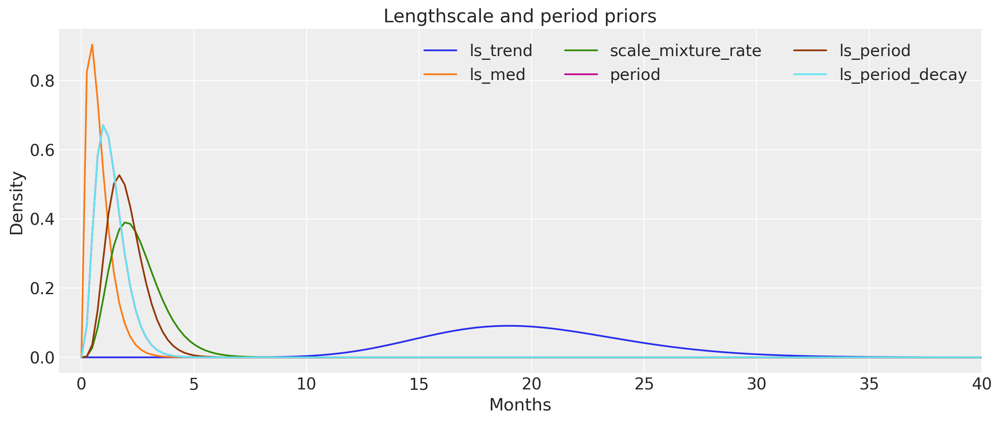

In [11]:
x = np.linspace(0, 120, 500)
priors = [
    ("ls_trend", pm.Gamma.dist(alpha=20, beta=1)),
    ("ls_med", pm.Gamma.dist(alpha=2, beta=2.5)),
    ("scale_mixture_rate", pm.Gamma.dist(alpha=5, beta=2)),
    ("period", pm.Gamma.dist(alpha=4, beta=3)),
    ("ls_period", pm.Gamma.dist(alpha=6, beta=3)),
    ("ls_period_decay", pm.Gamma.dist(alpha=4, beta=3)),
]

fig = plt.figure(figsize=(12, 5))

for i, prior in enumerate(priors):
    plt.plot(x, np.exp(prior[1].logp(x).eval()), label=prior[0])

plt.xlim((-1, 40))
plt.xlabel("Months")
plt.ylabel("Density")
plt.title("Lengthscale and period priors")
plt.legend(ncol=3);

Now we have to think about priors for our scale parameters: `amplitude_trend` (the scale of the long term trend), `amplitude_med` (the scale of the short to medium term component), and `amplitude_per` (the scale of the semi-periodic component). We don't have a lot of prior information about these parameters, so let's choose a weakly informative prior:

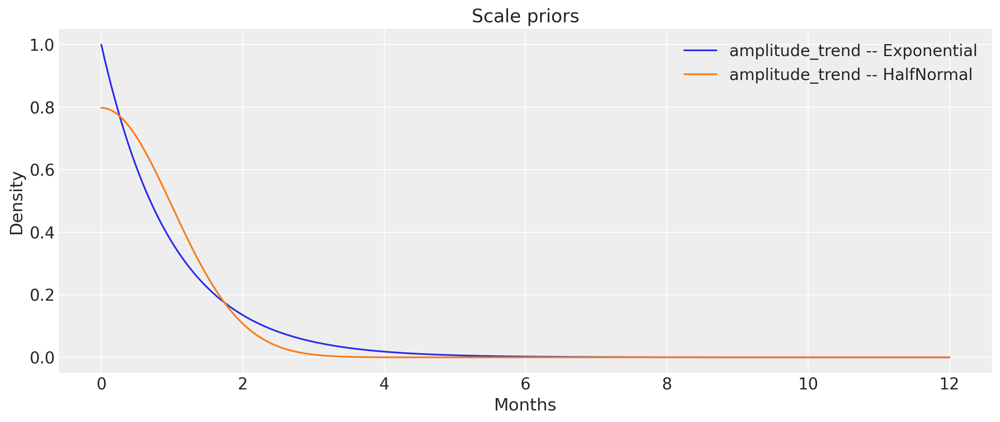

In [9]:
x = np.linspace(0, 12, 500)
priors = [
    ("amplitude_trend -- Exponential", pm.Exponential.dist(1)),
    ("amplitude_trend -- HalfNormal", pm.HalfNormal.dist(1)),
]

fig = plt.figure(figsize=(12, 5))

for i, prior in enumerate(priors):
    plt.plot(x, np.exp(prior[1].logp(x).eval()), label=prior[0])

plt.xlabel("Months")
plt.ylabel("Density")
plt.title("Scale priors")
plt.legend();

And now we can use these priors to simulate samples from the whole GP prior and see if our choices make sense:

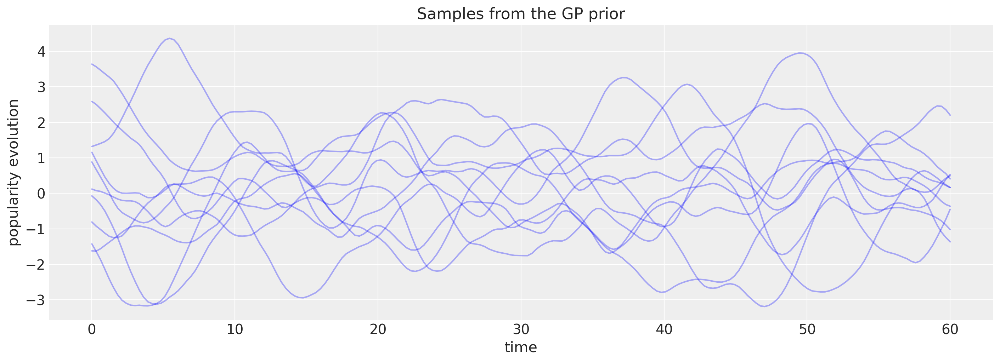

In [17]:
# long term trend
amplitude_trend = pm.HalfNormal.dist(1.0).random(1)
ls_trend = pm.Gamma.dist(alpha=20, beta=1).random(1)
cov_trend = amplitude_trend ** 2 * pm.gp.cov.Matern52(1, ls_trend)

# small/medium term irregularities
amplitude_med = pm.HalfNormal.dist(1.0).random(1)
ls_med = pm.Gamma.dist(alpha=10, beta=2).random(1)
# scale_mixture_rate = pm.Gamma.dist(alpha=5,  beta=2).random(1)
cov_medium = amplitude_med ** 2 * pm.gp.cov.Matern52(1, ls=ls_med)

X = np.linspace(0, 60, 200)[:, None]
cov = cov_trend + cov_medium
K = cov(X).eval()

plt.figure(figsize=(14, 5))
plt.plot(
    X,
    pm.MvNormal.dist(mu=np.zeros(K.shape[0]), cov=K).random(size=10).T,
    color="b",
    alpha=0.3,
)
plt.title("Samples from the GP prior")
plt.xlabel("time")
plt.ylabel("popularity evolution");

Finally, let's pick a prior for our `baseline` parameter, i.e the intercept of our Gaussian Process regression. In other words, this will be the mean function of our GP -- the value it reverts to when data start lacking. There we have quite a lot of information: 50% popularity is historically quite high for a French president (just take a look at the whole dataset we loaded at the beginning of the NB), so keeping the mean at zero is sub-optimal -- remember that `baseline` lives on the logit scale, so a prior centered at 0 means a prior centered at $logistic(0) = 0.5$ on the outcome space. 

We can do better: based on our domain knowledge, we expect most president to have a baseline popularity between 20% and 50% -- in other words, French people rarely love their presidents but often _really_ dislike them. $Normal(-0.7, 0.5)$ looks reasonable in that regard: it expects 95% of the probability mass to be between -1.7 and 0.3, i.e $logistic(-1.7) = 15\%$ and $logistic(0.3) = 57\%$, with a mean approval of $logistic(-0.7) = 33\%$:

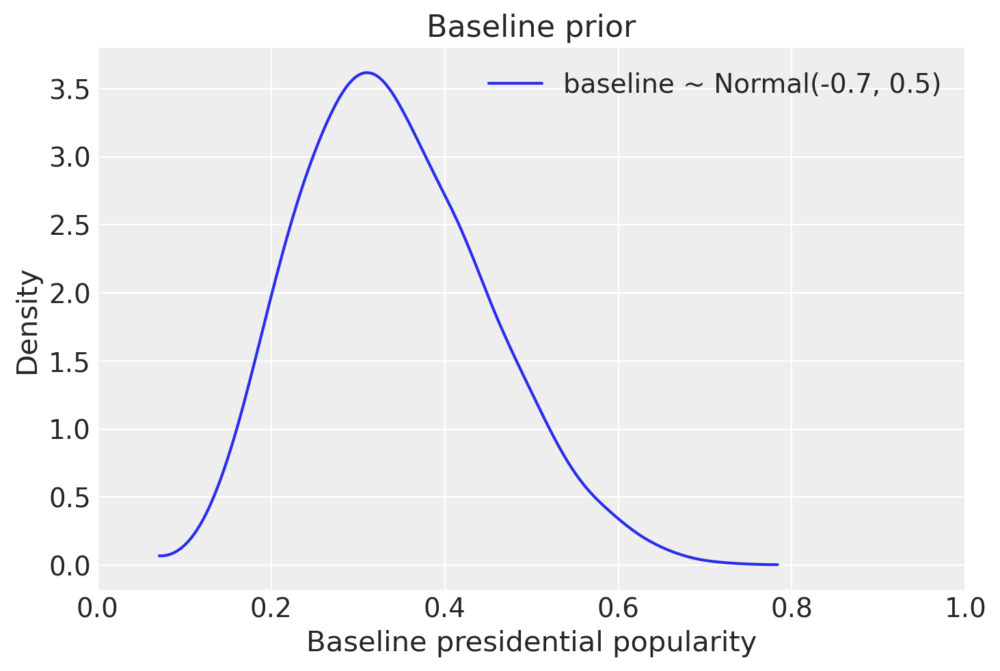

In [22]:
ax = az.plot_kde(
    logistic(pm.Normal.dist(-0.7, 0.5).random(size=20_000)),
    label="baseline ~ Normal(-0.7, 0.5)",
)
ax.set_xlim((0, 1))
ax.set_xlabel("Baseline presidential popularity")
ax.set_ylabel("Density")
ax.set_title("Baseline prior");

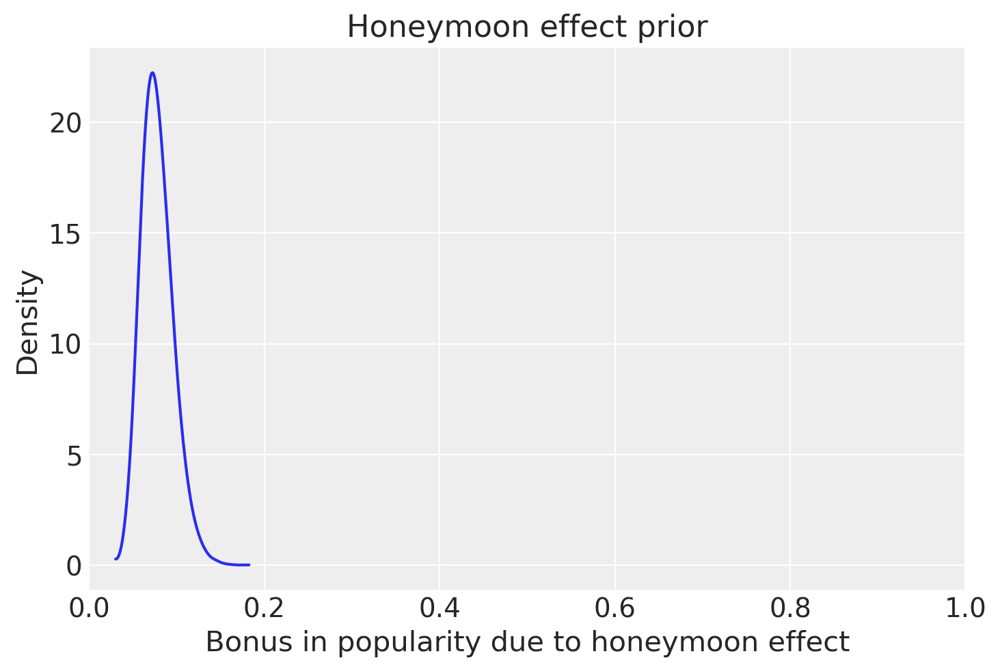

In [23]:
ax = az.plot_kde(logistic(pm.Normal.dist(-2.5, 0.25).random(size=20_000)),)
ax.set_xlim((0, 1))
ax.set_xlabel("Bonus in popularity due to honeymoon effect")
ax.set_ylabel("Density")
ax.set_title("Honeymoon effect prior");

In [18]:
MAX_OBSERVED = len(d.index)
COORDS = {"timesteps": np.arange(MAX_OBSERVED)}

In [19]:
TIME_BEFORE_ORIGIN = 24  # 2 years prior any data
MAX_TIME = MAX_OBSERVED + 24  # 2 years out-of-sample
RANGE_OOS = MAX_TIME + TIME_BEFORE_ORIGIN

tnew = np.linspace(-TIME_BEFORE_ORIGIN, MAX_TIME, RANGE_OOS)[:, None]

The unemployment data can be found [here](https://www.insee.fr/fr/statistiques/serie/001688526#Telechargement)

In [93]:
unemp = pd.read_csv("../data/predictors/chomage_national_trim.csv", sep=";", skiprows=2).iloc[:, [0, 1]]
unemp.columns = ["date", "unemployment"]
unemp = unemp.sort_values("date")

# as timestamps variables:
unemp.index = pd.period_range(start=unemp.date.iloc[0], periods=len(unemp), freq="Q")
unemp = unemp.drop("date", axis=1)
unemp

,unemployment
1975Q1,2.9
1975Q2,3.2
1975Q3,3.5
1975Q4,3.6
1976Q1,3.6
...,...
2019Q2,8.2
2019Q3,8.2
2019Q4,7.8
2020Q1,7.6


In [53]:
from fbprophet import Prophet

# REPLACE PROPHET BY A GRW FOR UNEMPLOYMENT. But first, finalize model as is with other improvements written above.

Importing plotly failed. Interactive plots will not work.


In [54]:
#fbp_data = stdz(np.log(unemp))
fbp_data = unemp
fbp_data.index = fbp_data.index.to_timestamp(how="End").normalize()
fbp_data = fbp_data.reset_index()
fbp_data = fbp_data.rename(columns={"index": "ds", "unemployment": "y"})
fbp_data['cap'] = 15.
fbp_data['floor'] = 2.
fbp_data

,ds,y,cap,floor
0,1975-03-31 23:59:59.999999999,2.9,15.0,2.0
1,1975-06-30 23:59:59.999999999,3.2,15.0,2.0
2,1975-09-30 23:59:59.999999999,3.5,15.0,2.0
3,1975-12-31 23:59:59.999999999,3.6,15.0,2.0
4,1976-03-31 23:59:59.999999999,3.6,15.0,2.0
...,...,...,...,...
177,2019-06-30 23:59:59.999999999,8.2,15.0,2.0
178,2019-09-30 23:59:59.999999999,8.2,15.0,2.0
179,2019-12-31 23:59:59.999999999,7.8,15.0,2.0
180,2020-03-31 23:59:59.999999999,7.6,15.0,2.0


In [55]:
unemp_model = Prophet(growth='logistic', seasonality_prior_scale=0.5, changepoint_prior_scale=0.01, mcmc_samples=1000)
unemp_model.fit(fbp_data, n_jobs=1)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [49]:
Prophet?

Init signature:
Prophet(
    growth='linear',
    changepoints=None,
    n_changepoints=25,
    changepoint_range=0.8,
    yearly_seasonality='auto',
    weekly_seasonality='auto',
    daily_seasonality='auto',
    holidays=None,
    seasonality_mode='additive',
    seasonality_prior_scale=10.0,
    holidays_prior_scale=10.0,
    changepoint_prior_scale=0.05,
    mcmc_samples=0,
    interval_width=0.8,
    uncertainty_samples=1000,
    stan_backend=None,
)
Docstring:     
Prophet forecaster.

Parameters
----------
growth: String 'linear' or 'logistic' to specify a linear or logistic
    trend.
changepoints: List of dates at which to include potential changepoints. If
    not specified, potential changepoints are selected automatically.
n_changepoints: Number of potential changepoints to include. Not used
    if input `changepoints` is supplied. If `changepoints` is not supplied,
    then n_changepoints potential changepoints are selected uniformly from
    the first `changepoint_range`

In [149]:
unemp_ppc.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 206 entries, 1975-03-31 23:59:59.999999999 to 2022-06-30 23:59:59.999999999
Columns: 2000 entries, 0 to 1999
dtypes: float64(2000)
memory usage: 3.1 MB


/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/fbprophet/plot.py:88: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout()


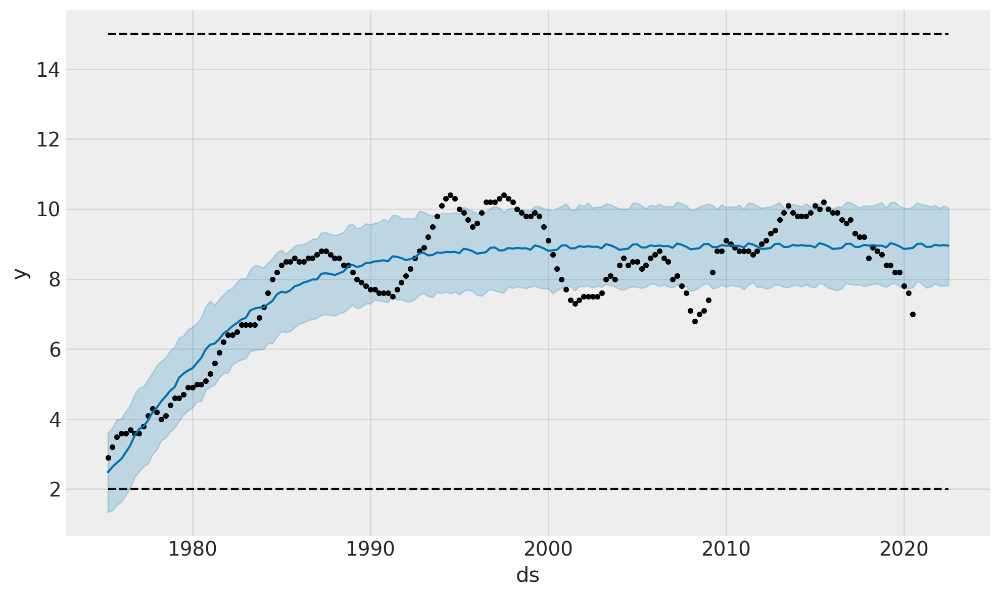

In [58]:
unemp_model.plot(unemp_forecast);

/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/fbprophet/plot.py:184: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.tight_layout()


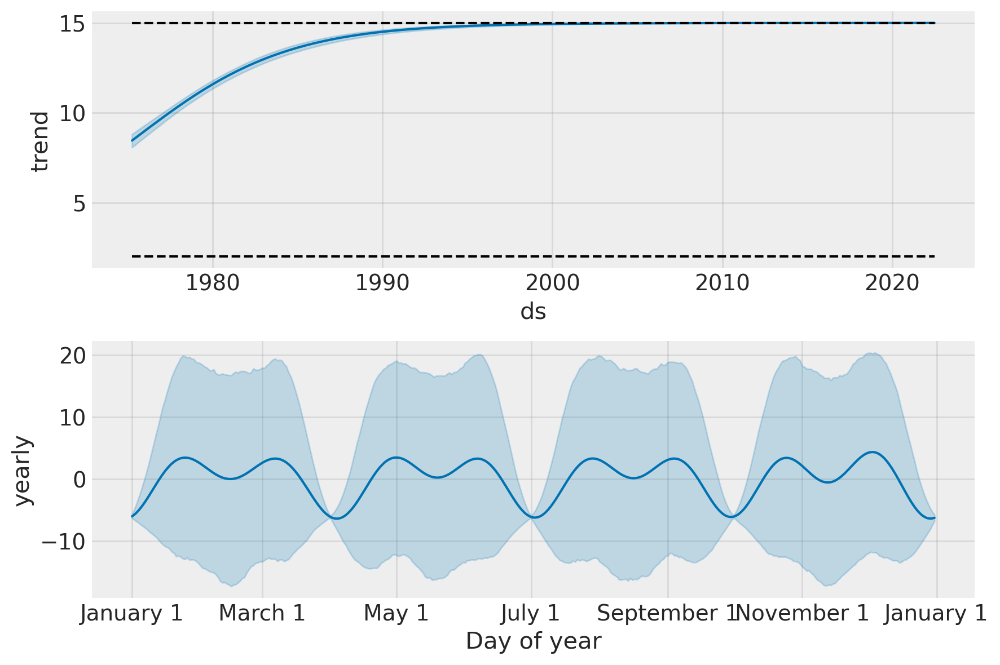

In [59]:
unemp_model.plot_components(unemp_forecast);

In [212]:
missing_unemployment = d[d.unemployment.isna()]
missing_unemployment

,quarter,president,samplesize,p_approve,p_disapprove,party,election_flag,N_approve,N_disapprove,N_total,unemployment
month,,,,,,,,,,,
2020-07-31,2020Q3,macron,991.2,0.398,0.602,center,0,394,597,991,NaN
2020-08-31,2020Q3,macron,1002.0,0.390,0.560,center,0,391,561,952,NaN


In [239]:
future_unemp = unemp_model.make_future_dataframe(periods=len(missing_unemployment) + 24, freq="M")
future_unemp["ds"] = future_unemp["ds"].dt.normalize() # convert times to midnight
future_unemp['cap'] = 15.
future_unemp['floor'] = 2.
future_unemp

,ds,cap,floor
0,1975-03-31,15.0,2.0
1,1975-06-30,15.0,2.0
2,1975-09-30,15.0,2.0
3,1975-12-31,15.0,2.0
4,1976-03-31,15.0,2.0
...,...,...,...
203,2022-04-30,15.0,2.0
204,2022-05-31,15.0,2.0
205,2022-06-30,15.0,2.0
206,2022-07-31,15.0,2.0


In [240]:
unemp_forecast = unemp_model.predict(future_unemp)
unemp_forecast

,ds,trend,cap,floor,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1975-03-31,8.457279,15.0,2.0,1.296924,4.111124,8.073523,8.809691,-5.717896,-6.481104,-4.916213,-5.717896,-6.481104,-4.916213,0.0,0.0,0.0,2.739384
1,1975-06-30,8.635699,15.0,2.0,1.393287,4.280546,8.262978,8.976086,-5.805982,-6.587648,-5.000090,-5.805982,-6.587648,-5.000090,0.0,0.0,0.0,2.829717
2,1975-09-30,8.815870,15.0,2.0,1.317083,4.148813,8.456492,9.146901,-6.087512,-6.858973,-5.300321,-6.087512,-6.858973,-5.300321,0.0,0.0,0.0,2.728358
3,1975-12-31,8.995556,15.0,2.0,1.273201,4.073030,8.644967,9.312311,-6.276614,-7.074217,-5.484401,-6.276614,-7.074217,-5.484401,0.0,0.0,0.0,2.718942
4,1976-03-31,9.172544,15.0,2.0,2.050476,4.485449,8.828599,9.474805,-5.915781,-6.303705,-5.516790,-5.915781,-6.303705,-5.516790,0.0,0.0,0.0,3.256763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,2022-04-30,14.999590,15.0,2.0,2.778461,33.809515,14.998966,14.999845,3.463784,-12.188293,19.044900,3.463784,-12.188293,19.044900,0.0,0.0,0.0,18.463374
204,2022-05-31,14.999598,15.0,2.0,1.537487,33.208904,14.998984,14.999848,2.291774,-13.510114,17.960425,2.291774,-13.510114,17.960425,0.0,0.0,0.0,17.291371
205,2022-06-30,14.999605,15.0,2.0,7.782570,10.508363,14.999000,14.999851,-5.862614,-6.505627,-5.191750,-5.862614,-6.505627,-5.191750,0.0,0.0,0.0,9.136991
206,2022-07-31,14.999612,15.0,2.0,2.015738,34.706047,14.999017,14.999854,3.255932,-12.874754,19.663699,3.255932,-12.874754,19.663699,0.0,0.0,0.0,18.255544


In [241]:
unemp_ppc = pd.DataFrame(unemp_model.predictive_samples(future_unemp)["yhat"], index=unemp_forecast.ds.values)

In [242]:
oos_unemploment_samples = unemp_ppc.loc[missing_unemployment.index[0]:]
oos_unemploment_samples

,0,1,2,3,4,5,6,7,8,9,...,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999
2020-07-31,10.508555,28.130312,32.397869,23.883090,15.408926,9.903570,21.739209,11.336662,21.916725,2.604304,...,3.676935,9.426249,-8.324530,7.058469,3.663012,-10.529664,25.417202,4.872643,24.822289,15.103521
2020-08-31,19.985299,23.181191,13.492631,10.357478,11.118421,18.021927,14.187637,24.266778,21.254322,39.428258,...,5.110771,35.462593,14.838325,9.783371,26.335166,31.133245,22.221248,41.793934,14.298591,23.365975
2020-09-30,8.536095,10.539226,8.369458,10.288168,8.060901,9.633148,7.694801,7.557002,8.092409,8.984116,...,8.060802,7.265728,9.960604,8.430488,8.673037,9.779289,7.581588,8.517139,8.799517,9.401680
2020-10-31,22.491273,22.468980,36.995786,37.477694,37.843353,35.848253,16.092745,14.422699,24.606553,-5.505074,...,11.638099,21.888104,20.244515,48.928412,26.193798,7.871320,7.519205,-1.605048,7.124335,23.473885
2020-11-30,7.574499,-3.748405,1.382709,5.348545,-1.495147,16.300041,34.600630,8.379334,35.298804,4.329657,...,30.316007,4.341009,11.403046,21.149170,14.425166,23.521128,15.337609,23.464705,44.634671,21.617643
2020-12-31,8.453838,9.102244,9.392544,8.656515,8.693061,7.132925,8.016918,11.510910,6.400584,8.893057,...,9.036119,7.762504,9.355428,7.933364,9.488830,10.447866,8.577630,9.665402,8.570754,9.306299
2021-01-31,4.762479,23.909440,18.708725,32.561197,17.813659,25.042563,23.791938,31.452313,26.402424,28.348597,...,37.631543,23.657467,37.496878,5.904773,24.793546,43.752663,9.121133,-2.105352,10.113184,14.757210
2021-02-28,23.095326,32.692594,13.642747,-5.974361,36.445342,19.324538,9.058576,10.914041,22.913062,28.822717,...,14.789663,-9.551087,11.711812,6.270901,30.637520,-0.466997,41.932689,30.201315,-10.543070,19.164578
2021-03-31,7.670520,9.066698,7.875969,9.775648,9.796318,9.224184,8.688298,8.676933,9.142265,9.181723,...,9.234656,8.521992,10.326665,8.583817,9.518045,9.498753,9.300835,7.932228,8.615976,9.562855
2021-04-30,9.270740,23.819369,-4.152321,23.348471,14.839968,7.934762,16.961572,15.717572,3.646946,32.984906,...,18.043856,20.764120,14.164918,25.390925,-12.812015,38.450884,15.548150,33.782561,25.285213,10.371155


In [243]:
random_draw = np.random.choice(oos_unemploment.columns)
random_draw

1922

In [244]:
oos_unemploment_draws = oos_unemploment_samples[random_draw]
oos_unemploment_draws

2020-07-31     3.850745
2020-08-31    -1.536397
2020-09-30     9.674323
2020-10-31    16.712977
2020-11-30    31.401094
2020-12-31     8.717401
2021-01-31    13.860350
2021-02-28    17.454382
2021-03-31     9.283308
2021-04-30    33.860055
2021-05-31    28.023549
2021-06-30     7.473716
2021-07-31     3.526976
2021-08-31    -1.090954
2021-09-30     9.666225
2021-10-31    17.828632
2021-11-30    30.048324
2021-12-31     8.670876
2022-01-31    13.235861
2022-02-28    16.284824
2022-03-31     8.262797
2022-04-30    31.930862
2022-05-31    28.269403
2022-06-30     8.909109
2022-07-31     2.382469
2022-08-31     0.530181
Name: 1922, dtype: float64

In [245]:
d.unemployment.fillna(oos_unemploment_draws[missing_unemployment.index])

month
2002-05-31    7.500000
2002-06-30    7.500000
2002-07-31    7.500000
2002-08-31    7.500000
2002-09-30    7.500000
                ...   
2020-04-30    7.000000
2020-05-31    7.000000
2020-06-30    7.000000
2020-07-31    3.850745
2020-08-31   -1.536397
Name: unemployment, Length: 220, dtype: float64

In [94]:
d = d.reset_index()

# add quarters to main dataframe:
d.index = pd.DatetimeIndex(d["index"].values).to_period("Q")
d.index.name = "quarter"

# merge with unemployment:
d = d.join(unemp).reset_index().set_index("index")
d.index.name = "month"
#d["unemployment"] = d.unemployment.fillna(method="ffill")
d

,quarter,president,samplesize,p_approve,p_disapprove,party,election_flag,N_approve,N_disapprove,N_total,unemployment
month,,,,,,,,,,,
2002-05-31,2002Q2,chirac2,964.250000,0.502500,0.442500,right,1,485,427,912,7.5
2002-06-30,2002Q2,chirac2,970.000000,0.505000,0.425000,right,0,490,412,902,7.5
2002-07-31,2002Q3,chirac2,947.333333,0.533333,0.406667,right,0,505,385,890,7.5
2002-08-31,2002Q3,chirac2,1028.000000,0.520000,0.416667,right,0,535,428,963,7.5
2002-09-30,2002Q3,chirac2,1017.500000,0.525000,0.420000,right,0,534,427,961,7.5
...,...,...,...,...,...,...,...,...,...,...,...
2020-04-30,2020Q2,macron,1174.400000,0.406000,0.582000,center,0,477,684,1161,7.0
2020-05-31,2020Q2,macron,1126.428571,0.371429,0.594286,center,0,418,669,1087,7.0
2020-06-30,2020Q2,macron,1124.714286,0.362857,0.612857,center,0,408,689,1097,7.0


As the most recent values for unemployment are missing, we will impute them automatically while fitting the model. That way, our imputations will be informed by all the information the model has about the other parameters. This is quite simple to do in PyMC3: we just have to declare the unemployment values as a masked array. Also, the model will care about the order of magnitude of the unemployment, not the intrisic values, so we take the log of the unemployment. Finally, we need to standardize the data (mean 0 and standard deviation 1) so that our sampler has a better time sampling. Let's set this up:

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 8 jobs)
NUTS: [f_time_rotated_, ls_trend, amplitude_trend, log_unemp_effect, honeymoon, baseline]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1556 seconds.


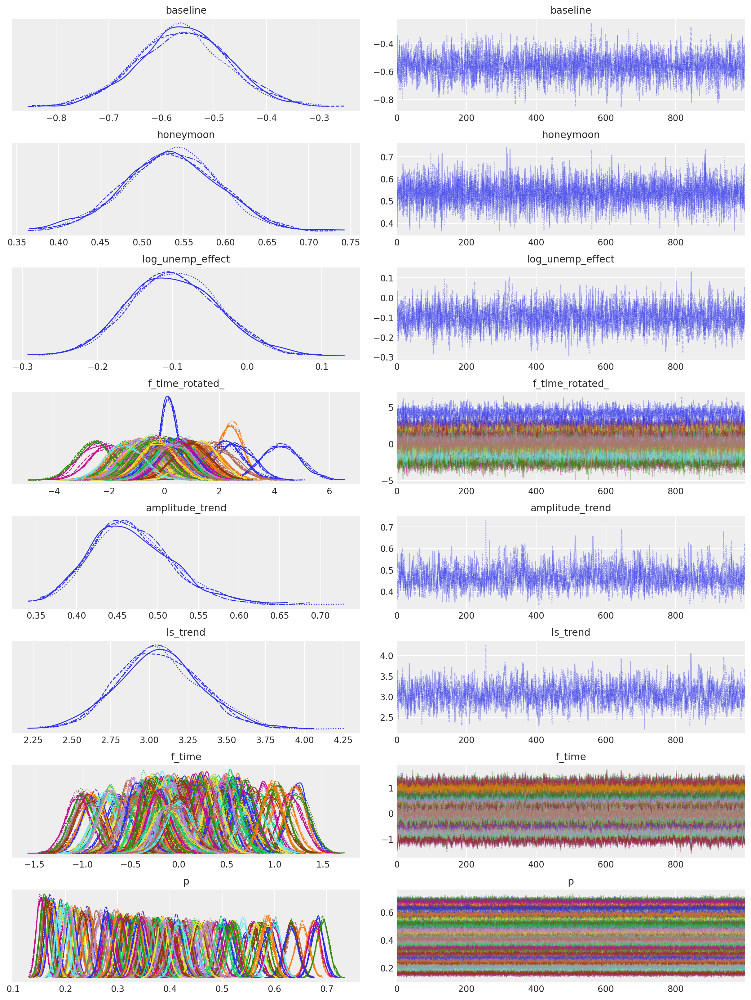

In [17]:
# economy: GRW, or just uncertainty in x?
# uncertainty in y OR overdispersion

with pm.Model(coords=COORDS) as econ_latent_gp:
    # intercept on logit scale
    baseline = pm.Normal("baseline", -0.7, 0.5)

    # honeymoon slope
    honeymoon = pm.Normal("honeymoon", 0., 0.5)
    
    # log unemployment slope
    log_unemp_effect = pm.Normal("log_unemp_effect", 0., 0.5)

    # long term trend
    amplitude_trend = pm.Exponential("amplitude_trend", 1.0)
    ls_trend = pm.Gamma("ls_trend", alpha=5, beta=2)
    cov_trend = amplitude_trend ** 2 * pm.gp.cov.Matern52(1, ls_trend)

    # instantiate gp
    gp = pm.gp.Latent(cov_func=cov_trend)
    # evaluate GP at time points
    f_time = gp.prior("f_time", X=time[:, None])

    # data
    election_flag = pm.Data("election_flag", d.election_flag.values, dims="timesteps")
    stdz_log_unemployment = pm.Data("stdz_log_unemployment", standardize(np.log(d.unemployment)).values, dims="timesteps")

    p = pm.Deterministic(
        "p",
        pm.math.invlogit(baseline + f_time + honeymoon * election_flag + log_unemp_effect * stdz_log_unemployment),
        dims="timesteps",
    )

    y = pm.Binomial("y", p=p, n=d.N_total, observed=d.N_approve, dims="timesteps")

    trace_econ = pm.sample(
        chains=4,
        cores=8,
        return_inferencedata=True,
        idata_kwargs={
            "dims": {"f_time": ["timesteps"], "f_time_rotated_": ["timesteps"]}
        },
    )

az.plot_trace(trace_econ, compact=True);

In [18]:
az.to_netcdf(trace_econ, "trace_econ_raw.nc")

'trace_econ_raw.nc'

In [19]:
az.summary(trace_econ, var_names=["~p", "~f_time", "~f_time_rotated_"], round_to=2)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_mean,ess_sd,ess_bulk,ess_tail,r_hat
baseline,-0.56,0.09,-0.72,-0.39,0.00,0.00,2230.92,2189.74,2236.71,2669.17,1.0
honeymoon,0.54,0.06,0.43,0.64,0.00,0.00,4018.52,4018.52,4016.87,3040.88,1.0
log_unemp_effect,-0.10,0.06,-0.21,0.01,0.00,0.00,2147.85,2147.85,2158.04,2819.11,1.0
amplitude_trend,0.47,0.05,0.38,0.57,0.00,0.00,1162.67,1162.67,1165.56,1760.08,1.0
ls_trend,3.07,0.26,2.60,3.57,0.01,0.01,1094.74,1094.74,1094.89,1978.95,1.0


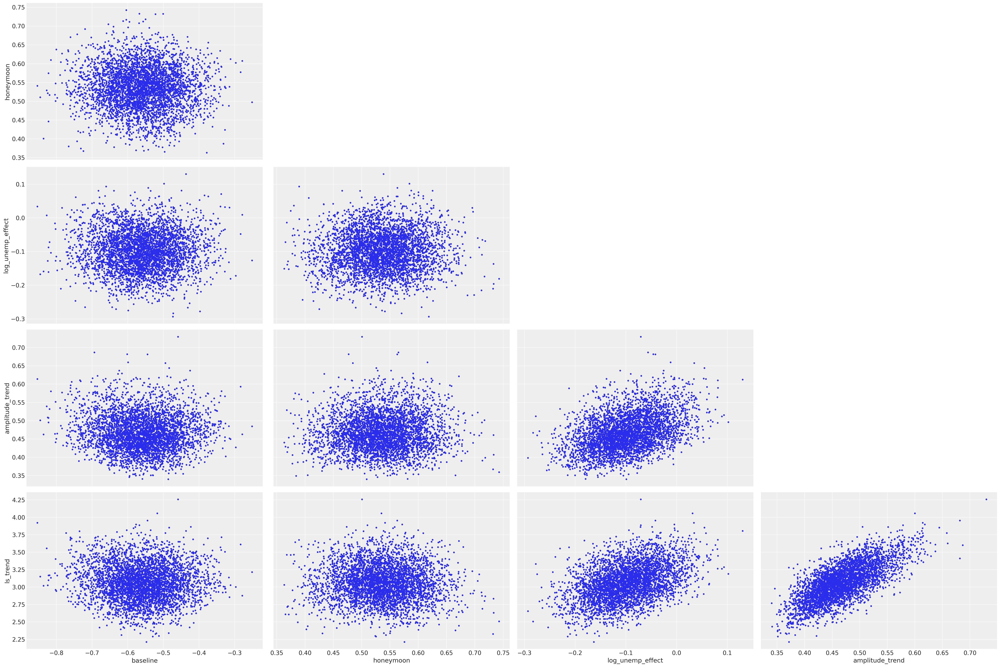

In [20]:
az.plot_pair(trace_econ, var_names=["~p", "~f_time", "~f_time_rotated_"], divergences=True);

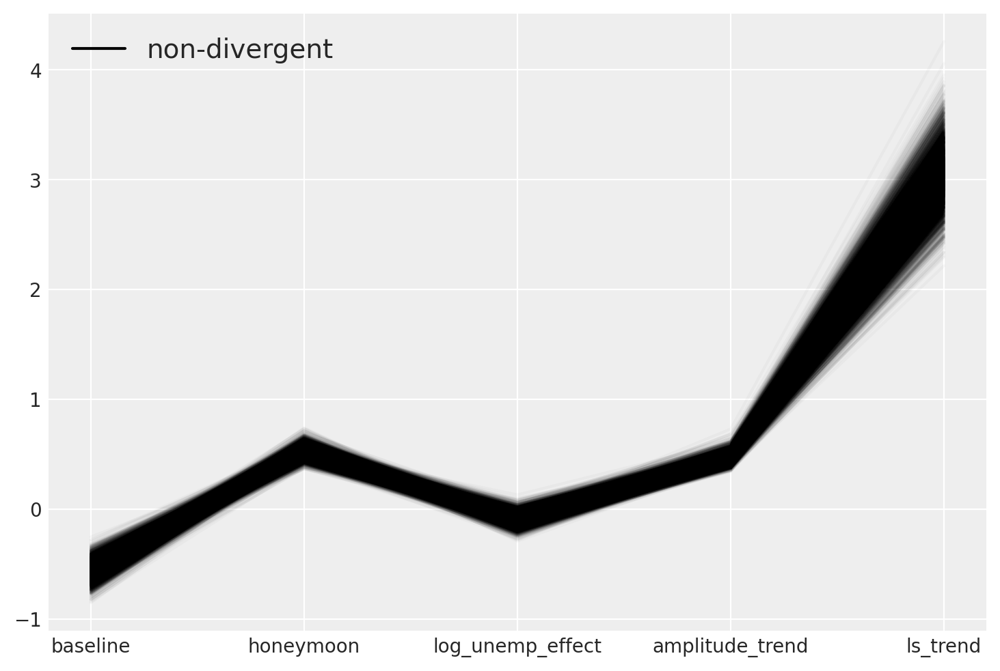

In [21]:
az.plot_parallel(trace_econ, var_names=["~p", "~f_time", "~f_time_rotated_"]);

In [27]:
TIME_BEFORE_ORIGIN = 0  # 2 years prior any data
MAX_TIME = MAX_OBSERVED + 24  # 2 years out-of-sample
RANGE_OOS = MAX_TIME + TIME_BEFORE_ORIGIN

tnew = np.linspace(-TIME_BEFORE_ORIGIN, MAX_TIME, RANGE_OOS)[:, None]

In [251]:
np.concatenate(
                (
                    np.zeros(TIME_BEFORE_ORIGIN, dtype=int),
                    standardize(np.log(d.unemployment)).values,
                    standardize(oos_unemploment_draws.iloc[len(missing_unemployment):]).values
                )
            )

array([-1.39217143, -1.39217143, -1.39217143, -1.39217143, -1.39217143,
       -1.26325083, -1.26325083, -1.26325083, -0.76399458, -0.76399458,
       -0.76399458, -0.64308168, -0.64308168, -0.64308168, -0.76399458,
       -0.76399458, -0.76399458, -0.2891022 , -0.2891022 , -0.2891022 ,
       -0.06007132, -0.06007132, -0.06007132, -0.2891022 , -0.2891022 ,
       -0.2891022 , -0.17391312, -0.17391312, -0.17391312, -0.17391312,
       -0.17391312, -0.17391312, -0.40567081, -0.40567081, -0.40567081,
       -0.2891022 , -0.2891022 , -0.2891022 , -0.06007132, -0.06007132,
       -0.06007132,  0.05245436,  0.05245436,  0.05245436,  0.16369401,
        0.16369401,  0.16369401, -0.06007132, -0.06007132, -0.06007132,
       -0.17391312, -0.17391312, -0.17391312, -0.76399458, -0.76399458,
       -0.76399458, -0.64308168, -0.64308168, -0.64308168, -1.01042199,
       -1.01042199, -1.01042199, -1.26325083, -1.26325083, -1.26325083,
       -1.9256399 , -1.9256399 , -1.9256399 , -2.34585032, -2.34

In [253]:
trace_econ = az.from_netcdf("trace_econ_raw.nc")

In [255]:
with econ_latent_gp:
    pm.set_data(
        {
            "election_flag": np.concatenate(
                (
                    np.zeros(TIME_BEFORE_ORIGIN, dtype=int),
                    d.election_flag.values,
                    np.zeros(
                        RANGE_OOS - (MAX_OBSERVED + TIME_BEFORE_ORIGIN), dtype=int
                    ),
                )
            ),
            "stdz_log_unemployment": np.concatenate(
                (
                    np.zeros(TIME_BEFORE_ORIGIN, dtype=int),
                    standardize(np.log(d.unemployment)).values,
                    standardize(oos_unemploment_draws.iloc[len(missing_unemployment):]).values
                )
            ),
        }
    )
    f_time_new = gp.conditional("f_time_new_4", Xnew=tnew)

    ppc = pm.sample_posterior_predictive(
        trace_econ.posterior, samples=1000, var_names=["baseline", "f_time_new_4", "honeymoon", "log_unemp_effect"]
    )

    az.from_pymc3_predictions(
        ppc,
        idata_orig=trace_econ,
        inplace=True,
        coords={"timesteps": np.arange(RANGE_OOS)},
        dims={"f_time_new_4": ["timesteps"]},
    )

trace_econ

Inference data with groups:
	> posterior
	> predictions
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data
	> predictions_constant_data

/Users/alex_andorra/opt/anaconda3/envs/elections-models/lib/python3.8/site-packages/pymc3/gp/util.py:125: UserWarning: There are `nan` entries in the [samples] arguments. The plot will not contain a band!
  warnings.warn(


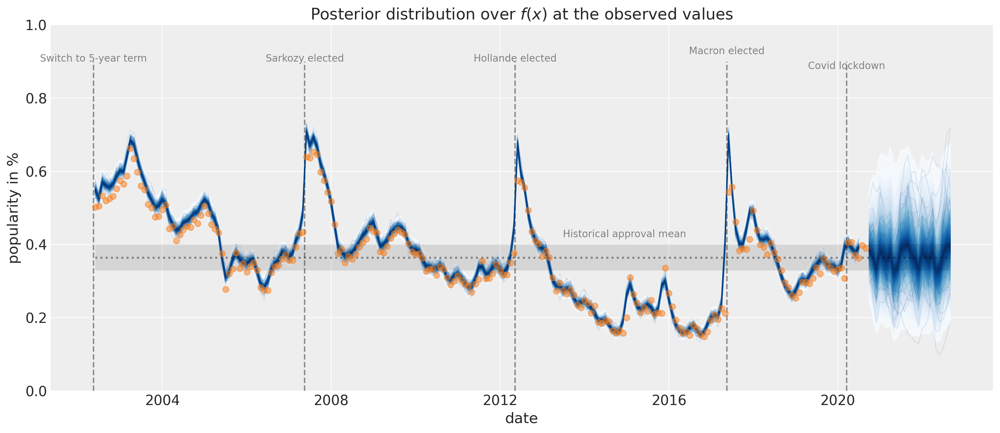

In [256]:
# plot the results
_, ax = plt.subplots(1, 1, figsize=(14, 6))

# plot the samples from the gp posterior with samples and shading
pp_prop = (
    logistic(
        trace_econ.predictions["baseline"]
        + trace_econ.predictions["f_time_new_4"]
        + trace_econ.predictions["honeymoon"]
        * trace_econ.predictions_constant_data["election_flag"]
        + trace_econ.predictions["log_unemp_effect"]
        * trace_econ.predictions_constant_data["stdz_log_unemployment"]
    )
    .stack(sample=("chain", "draw"))
    .data.T
)
pp_dates = pd.date_range(
    start=d.index[0] - np.timedelta64(TIME_BEFORE_ORIGIN, "M"),
    periods=RANGE_OOS,
    freq="M",
).values
pm.gp.util.plot_gp_dist(ax, pp_prop, pp_dates, plot_samples=True, palette="Blues")

# plot the data
ax.plot(d.index, d.p_approve.values, "o", color="C1", alpha=0.5)

ax.hlines(
    logistic(trace_econ.predictions["baseline"].mean()),
    pp_dates[0],
    pp_dates[-1],
    "k",
    ":",
    alpha=0.4,
    lw=2,
)
ax.fill_between(
    pp_dates,
    logistic(az.hdi(trace_econ.predictions)["baseline"]).sel(hdi="lower"),
    logistic(az.hdi(trace_econ.predictions)["baseline"]).sel(hdi="higher"),
    color="k",
    edgecolor="none",
    alpha=0.1,
)
ax.text(
    pd.to_datetime("2014-12-14"),
    0.42,
    "Historical approval mean",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2002-05-14"), 0.0, 0.9, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2002-05-14"),
    0.9,
    "Switch to 5-year term",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2007-05-16"), 0.0, 0.9, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2007-05-16"),
    0.9,
    "Sarkozy elected",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2012-05-11"), 0.0, 0.9, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2012-05-11"),
    0.9,
    "Hollande elected",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2017-05-17"), 0.0, 0.9, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2017-05-17"),
    0.92,
    "Macron elected",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

ax.vlines(pd.to_datetime("2020-03-17"), 0.0, 0.9, "k", "--", alpha=0.4)
ax.text(
    pd.to_datetime("2020-03-17"),
    0.88,
    "Covid lockdown",
    fontsize=10,
    color="grey",
    horizontalalignment="center",
)

# axis labels and title
ax.set_ylim((0, 1))
ax.set_xlabel("date")
ax.set_ylabel("popularity in %")
ax.set_title("Posterior distribution over $f(x)$ at the observed values");